# Dataset Downloading

In [45]:
rf = Roboflow(api_key="ZsZB2FnCmcNaslwIlejv")
project = rf.workspace("booksandcarsdataset").project("booksandcars")
dataset = project.version(4).download("coco")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to BooksAndCars-4 in coco:: 100%|██████████| 102/102 [00:00<00:00, 1568.70it/s]


# Faster R-CNN

Part of code is adopted from the [Roboflow guide on Detectron2](https://roboflow.com/model/detectron2).

## Installing packages and dependencies. Imports

In [36]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 KB 13.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp38-cp38-linux_x86_64.whl size=44089 sha256=1dfe7844ea87964b86c3a0058ec16dc6957af99222fedb1780c4a077251b2477
  Stored in directory: /root/.cache/pip/wheels/52/dd/2b/10ff8b0ac81b93946bb5fb9e6749bae2dac246506c8774e6cf
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
roboflow 0.2.32 requires PyYAML>=5.3.1, but you have pyyaml 5.1 which is incompatible.
dask 2022.2.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompati

In [37]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  1.13 ; cuda:  cu116
detectron2: 0.6


In [38]:
!pip install roboflow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 701.2/701.2 KB 27.1 MB/s eta 0:00:00
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 5.1
    Uninstalling PyYAML-5.1:
      Successfully uninstalled PyYAML-5.1


In [39]:
import numpy as np
import cv2
import random
from datetime import datetime
from google.colab.patches import cv2_imshow

from roboflow import Roboflow


In [40]:
# DATA SET PREPARATION AND LOADING
from detectron2.data.datasets import register_coco_instances
from detectron2.data import DatasetCatalog, MetadataCatalog

# VISUALIZATION
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode

# CONFIGURATION
from detectron2 import model_zoo
from detectron2.config import get_cfg

# EVALUATION
from detectron2.engine import DefaultPredictor

# TRAINING
from detectron2.engine import DefaultTrainer

## Dataset Registration

Required step for running a detectron2 model.

In [46]:
DATA_SET_NAME = dataset.name.replace(" ", "-")
ANNOTATIONS_FILE_NAME = "_annotations.coco.json"

In [49]:
# TRAIN SET
TRAIN_DATA_SET_NAME = f"{DATA_SET_NAME}-train"
TRAIN_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "train")
TRAIN_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "train", ANNOTATIONS_FILE_NAME)


# TEST SET
TEST_DATA_SET_NAME = f"{DATA_SET_NAME}-test"
TEST_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "test")
TEST_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "test", ANNOTATIONS_FILE_NAME)


# VALID SET
VALID_DATA_SET_NAME = f"{DATA_SET_NAME}-valid"
VALID_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "valid")
VALID_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "valid", ANNOTATIONS_FILE_NAME)

In [50]:
try:
    register_coco_instances(
        name=TRAIN_DATA_SET_NAME, 
        metadata={}, 
        json_file=TRAIN_DATA_SET_ANN_FILE_PATH, 
        image_root=TRAIN_DATA_SET_IMAGES_DIR_PATH
    )
    register_coco_instances(
        name=TEST_DATA_SET_NAME, 
        metadata={}, 
        json_file=TEST_DATA_SET_ANN_FILE_PATH, 
        image_root=TEST_DATA_SET_IMAGES_DIR_PATH
    )

    register_coco_instances(
        name=VALID_DATA_SET_NAME, 
        metadata={}, 
        json_file=VALID_DATA_SET_ANN_FILE_PATH, 
        image_root=VALID_DATA_SET_IMAGES_DIR_PATH
    )
except AssertionError:
    pass

In [51]:
[
    data_set
    for data_set
    in MetadataCatalog.list()
    if data_set.startswith(DATA_SET_NAME)
]

['BooksAndCars-train', 'BooksAndCars-test', 'BooksAndCars-valid']

## Visualising the Images

Let us look at the training samples.

Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



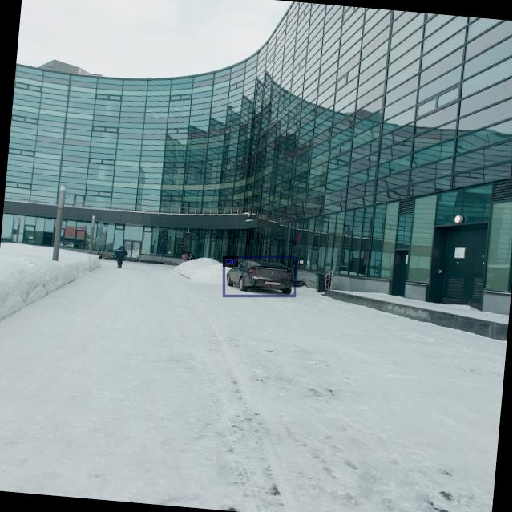

In [52]:
metadata = MetadataCatalog.get(TRAIN_DATA_SET_NAME)
dataset_train = DatasetCatalog.get(TRAIN_DATA_SET_NAME)

dataset_entry = dataset_train[1]
image = cv2.imread(dataset_entry["file_name"])

visualizer = Visualizer(
    image[:, :, ::-1],
    metadata=metadata, 
    scale=0.8, 
    instance_mode=ColorMode.IMAGE_BW
)

out = visualizer.draw_dataset_dict(dataset_entry)
cv2_imshow(out.get_image()[:, :, ::-1])

## Model Training

### Forming a Config file

In [53]:
# HYPERPARAMETERS
ARCHITECTURE = "faster_rcnn_R_101_FPN_3x"
CONFIG_FILE_PATH = f"COCO-Detection/{ARCHITECTURE}.yaml"
MAX_ITER = 3000
EVAL_PERIOD = 300
BASE_LR = 0.001
NUM_CLASSES = 2

# OUTPUT DIR
OUTPUT_DIR_PATH = os.path.join(
    DATA_SET_NAME, 
    ARCHITECTURE, 
    datetime.now().strftime('%Y-%m-%d-%H-%M-%S')
)

os.makedirs(OUTPUT_DIR_PATH, exist_ok=True)

In [54]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(CONFIG_FILE_PATH))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(CONFIG_FILE_PATH)
cfg.DATASETS.TRAIN = (TRAIN_DATA_SET_NAME,)
cfg.DATASETS.TEST = (TEST_DATA_SET_NAME,)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.TEST.EVAL_PERIOD = EVAL_PERIOD
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.INPUT.MASK_FORMAT='bitmask'
cfg.SOLVER.BASE_LR = BASE_LR
cfg.SOLVER.MAX_ITER = MAX_ITER
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES
cfg.OUTPUT_DIR = OUTPUT_DIR_PATH

### Training

In [55]:
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[03/06 17:34:30 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f6e8b1.pkl: 243MB [00:11, 21.7MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[03/06 17:34:45 d2.engine.train_loop]: Starting training from iteration 0


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)


[03/06 17:34:56 d2.utils.events]:  eta: 0:21:28  iter: 19  total_loss: 1.554  loss_cls: 0.916  loss_box_reg: 0.4573  loss_rpn_cls: 0.03012  loss_rpn_loc: 0.05651  time: 0.4362  last_time: 0.4212  data_time: 0.0199  last_data_time: 0.0163   lr: 1.9981e-05  max_mem: 2555M
[03/06 17:35:05 d2.utils.events]:  eta: 0:21:26  iter: 39  total_loss: 1.34  loss_cls: 0.7345  loss_box_reg: 0.4888  loss_rpn_cls: 0.04523  loss_rpn_loc: 0.04364  time: 0.4388  last_time: 0.4777  data_time: 0.0137  last_data_time: 0.0060   lr: 3.9961e-05  max_mem: 2555M
[03/06 17:35:13 d2.utils.events]:  eta: 0:20:44  iter: 59  total_loss: 1.082  loss_cls: 0.5006  loss_box_reg: 0.4679  loss_rpn_cls: 0.02655  loss_rpn_loc: 0.0766  time: 0.4291  last_time: 0.3699  data_time: 0.0100  last_data_time: 0.0091   lr: 5.9941e-05  max_mem: 2555M
[03/06 17:35:22 d2.utils.events]:  eta: 0:20:42  iter: 79  total_loss: 0.7897  loss_cls: 0.318  loss_box_reg: 0.372  loss_rpn_cls: 0.01564  loss_rpn_loc: 0.04661  time: 0.4301  last_time:

In [56]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir $OUTPUT_DIR_PATH

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
2023-03-06 17:59:18.871366: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.8/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2023-03-06 17:59:18.871484: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.8/dist-packages/cv2/../../lib64:/usr/lib64-nvidia
2023-03-06 17:59:18.871498: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are inst

## Evaluation

In [58]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2
predictor = DefaultPredictor(cfg)

[03/06 18:08:54 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from BooksAndCars/faster_rcnn_R_101_FPN_3x/2023-03-06-17-34-22/model_final.pth ...


In [63]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("BooksAndCars-train", cfg, False, output_dir="./fasterrcnn_output/")
val_loader = build_detection_test_loader(cfg, "BooksAndCars-train")
inference_on_dataset(trainer.model, val_loader, evaluator)

[03/06 18:13:32 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [03/06 18:13:32 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [03/06 18:13:32 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/06 18:13:32 d2.data.datasets.coco]: Loaded 84 images in COCO format from /content/yolov5/BooksAndCars-4/train/_annotations.coco.json
[03/06 18:13:32 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/06 18:13:32 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/06 18:13:32 d2.data.common]: Serializing 84 elements to byte tensors and concatenating them all ...
[03/06 18:13:32 d2.data.common]: Serializ

OrderedDict([('bbox',
              {'AP': 36.53638910643488,
               'AP50': 46.85679578345022,
               'AP75': 43.72771056815312,
               'APs': 31.190758329226586,
               'APm': 36.89193113191871,
               'APl': 36.50231382506657,
               'AP-books-cars': nan,
               'AP-book': 73.07277821286976,
               'AP-car': 0.0})])

In [ ]:
def evaluate(dataset):
    for d in dataset:
        img = cv2.imread(d["file_name"])
        outputs = predictor(img)
        
        visualizer = Visualizer(
            img[:, :, ::-1],
            metadata=metadata, 
            scale=0.8, 
            instance_mode=ColorMode.IMAGE_BW
        )
        out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
        cv2_imshow(out.get_image()[:, :, ::-1])

WARNING [03/06 12:05:22 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[03/06 12:05:22 d2.data.datasets.coco]: Loaded 5 images in COCO format from /content/BooksAndCars-4/test/_annotations.coco.json


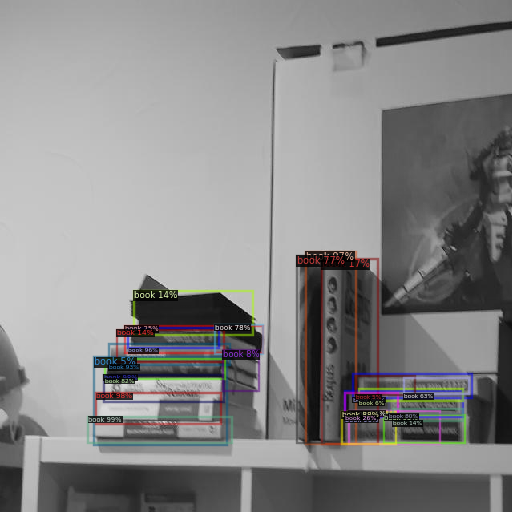

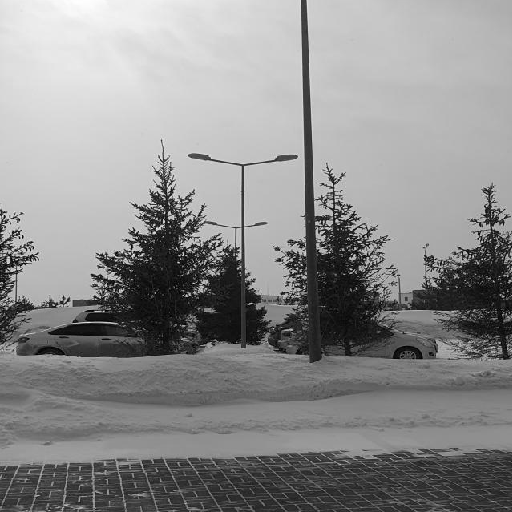

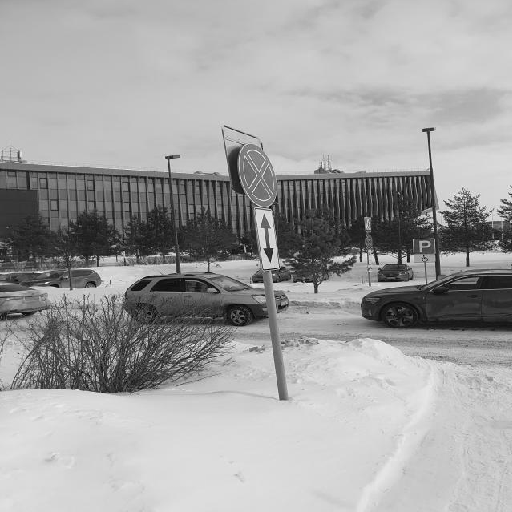

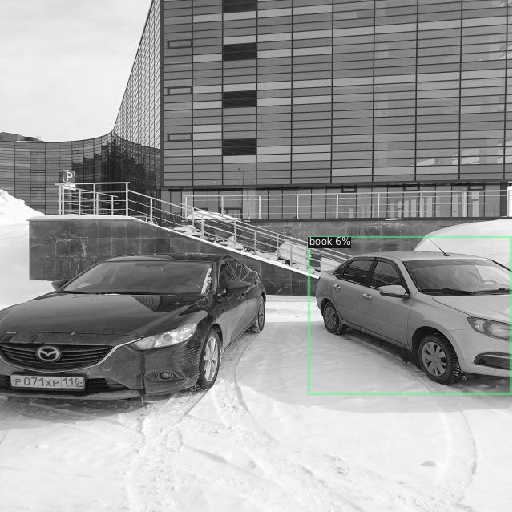

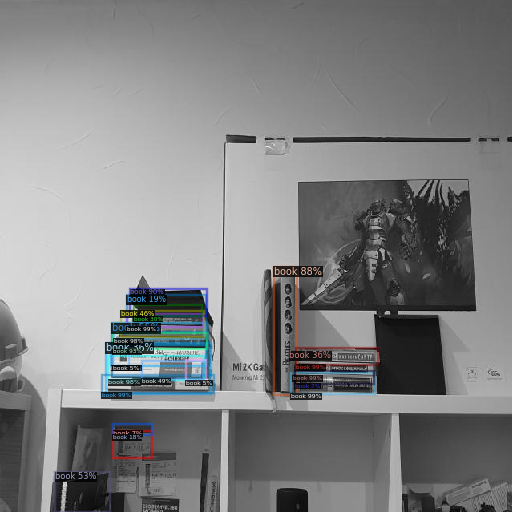

In [ ]:
dataset_test = DatasetCatalog.get(TEST_DATA_SET_NAME)
evaluate(dataset_test)

## mAP, Speed, Size

- **mAP among all classes:**

```
    mAP50 = 0.469
    mAP50-95 = 0.365
```

- **Speed of inference:** 116.3 ms

- **Model Size:** 330.1 MB

In [ ]:
"""
[03/06 18:13:43 d2.evaluation.coco_evaluation]: Evaluation results for bbox: 
|   AP   |  AP50  |  AP75  |  APs   |  APm   |  APl   |
|:------:|:------:|:------:|:------:|:------:|:------:|
| 36.536 | 46.857 | 43.728 | 31.191 | 36.892 | 36.502 |
[03/06 18:13:43 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category   | AP   | category   | AP     | category   | AP    |
|:-----------|:-----|:-----------|:-------|:-----------|:------|
| books-cars | nan  | book       | 73.073 | car        | 0.000 |

...

[03/06 18:13:42 d2.evaluation.evaluator]: Total inference time: 0:00:09.183993 (0.116253 s / iter per device, on 1 devices)
"""

Possible reasons for Cars class zero mAP:

1. Class imbalance:

|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
| books-cars | 0            |    book    | 442          |    car     | 183          |
|            |              |            |              |            |              |
|   total    | 625          |            |              |            |              |

2. Poor Dataset Quality:

In the original dataset, there are 88 bboxes with cars (which were augmented to 183 samples, as you see in the table above). Among these 88 examples, there are plenty of ways a car was captured at the photo: side, back, front, diagonally, from afar, from near. Such variability together with lack of data could lead to poor performance within the limited number of epochs.

The books case is much easier: all of them were captured from approximately same distance and angle. Moreover, there are more books samples in the dataset. So, the model has managed to converge well during the training process. The resulted `mAP50:95` is 0.73.

# YOLOv5

Part of code is adopted from the [Roboflow guide on YOLOv5](https://roboflow.com/model/yolov5).

## Installing modules and dependencies

In [1]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 064365d8683fd002e9ad789c1e91fa3d021b44f0

Cloning into 'yolov5'...
remote: Enumerating objects: 15287, done.
remote: Total 15287 (delta 0), reused 0 (delta 0), pack-reused 15287
Receiving objects: 100% (15287/15287), 14.18 MiB | 20.81 MiB/s, done.
Resolving deltas: 100% (10483/10483), done.
/content/yolov5
HEAD is now at 064365d Update parse_opt() in export.py to work as in train.py (#10789)


In [2]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 KB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 39.9 MB/s eta 0:00:00
Setup complete. Using torch 1.13.1+cu116 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


In [3]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="ZsZB2FnCmcNaslwIlejv")
project = rf.workspace("booksandcarsdataset").project("booksandcars")
dataset = project.version(4).download("yolov5")


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 KB 5.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 KB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 KB 10.0 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=e13e390b55ff0250173346bfa6448758931091efa6e49358fe218ad5afde650e
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Successfully uninstalled pyparsing-3.0.9
  Attempting uninstall: cycler
    Found existing installation: cycler 0.11.0
    Uninstalling cycler-0.11.0:
      Successfully uninstalled cycler-0.11.0


loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to BooksAndCars-4 in yolov5pytorch:: 100%|██████████| 200/200 [00:00<00:00, 1713.52it/s]


In [4]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

names:
- book
- car
nc: 2
roboflow:
  license: CC BY 4.0
  project: booksandcars
  url: https://universe.roboflow.com/booksandcarsdataset/booksandcars/dataset/4
  version: 4
  workspace: booksandcarsdataset
test: ../test/images
train: BooksAndCars-4/train/images
val: BooksAndCars-4/valid/images


## Model Training

### Defining the Model Config and Architecture

Below is a yaml script defining the model parameters such as the number of classes, anchors, and each layer.

In [5]:
# define number of classes based on YAML
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [6]:
#this is the model configuration we will use for our tutorial 
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [7]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [9]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

### Training

In [23]:
# time its performance
%%time
%cd /content/yolov5/
!python train.py --img 640 --batch 16 --epochs 1500 --data {dataset.location}/data.yaml --cfg ./models/custom_yolov5s.yaml --weights '' --name yolov5s_results  --cache

/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=/content/yolov5/BooksAndCars-4/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=1500, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5s_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 44 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_b

### Evaluation

In [29]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 15180), started 0:19:12 ago. (Use '!kill 15180' to kill it.)

<IPython.core.display.Javascript object>

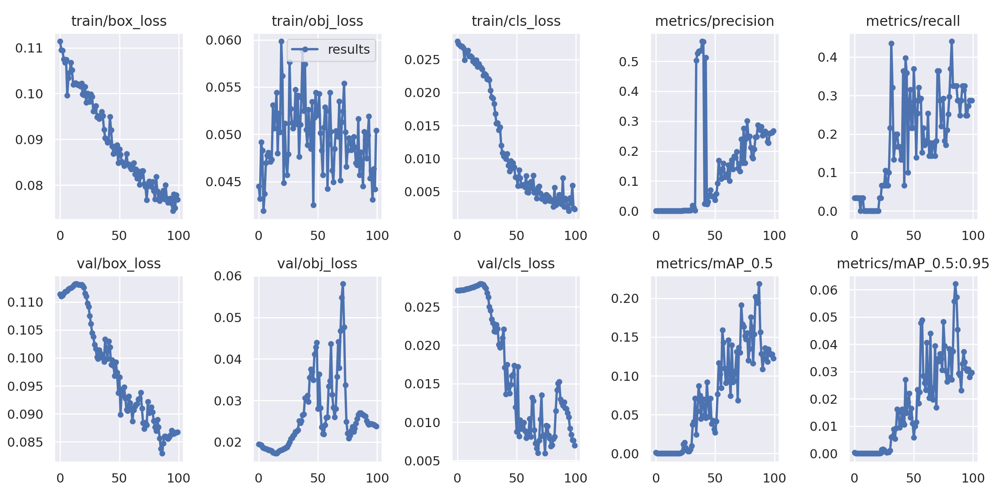

In [25]:
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

## Inference

In [26]:
# trained weights are saved by default in our weights folder
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [32]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.2 --source /content/yolov5/BooksAndCars-4/valid/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=/content/yolov5/BooksAndCars-4/valid/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/5 /content/yolov5/BooksAndCars-4/valid/images/20230303_114250_jpg.rf.69308f8388c77093818a92eca3dc6590.jpg: 416x416 8 cars, 8.1ms
image 2/5 /content/yolov5/BooksAndCars-4/valid/images/20230303_114326_jpg.rf.0c0539e7783bbbd3097fc9b8a65e35cb.jpg: 416x416 2 cars, 8.1ms
image 3/5 /co

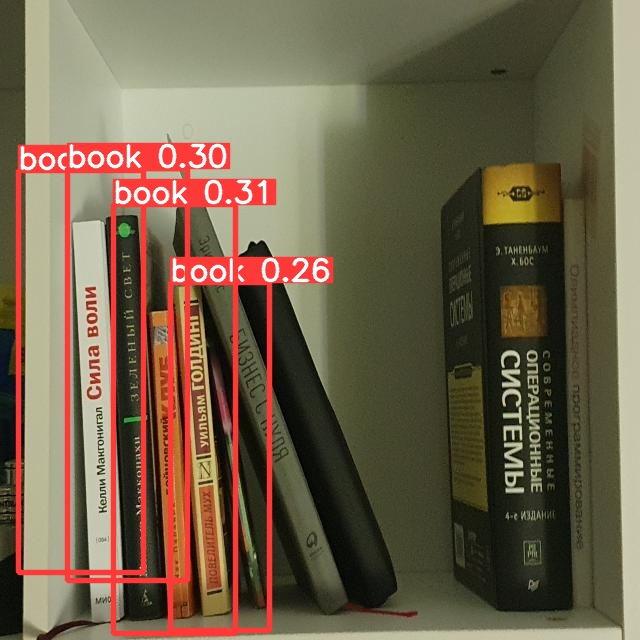

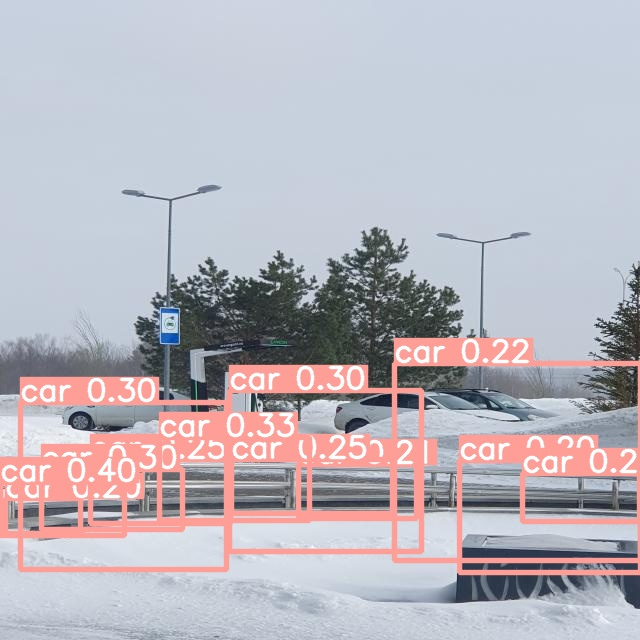

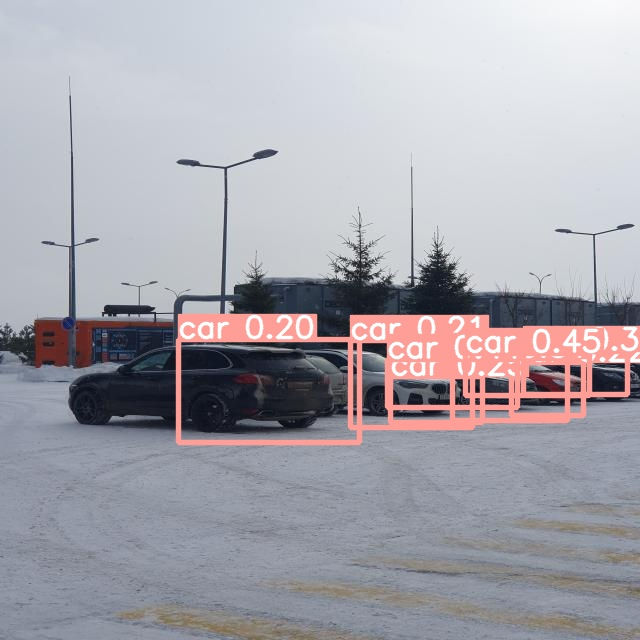

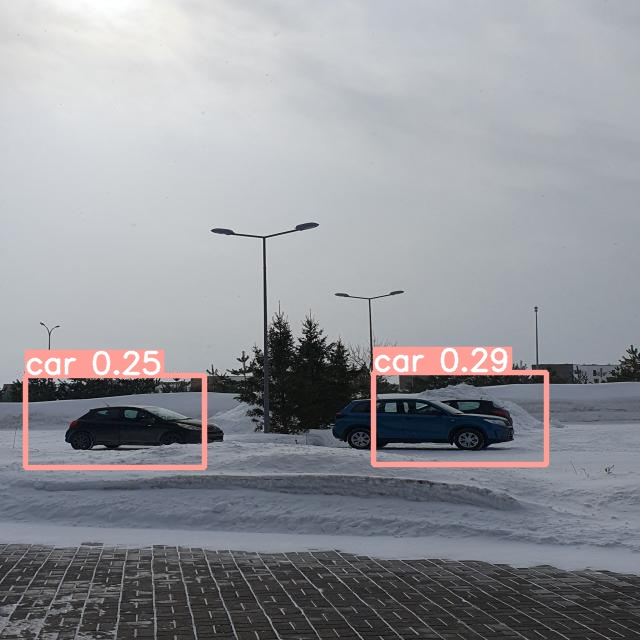

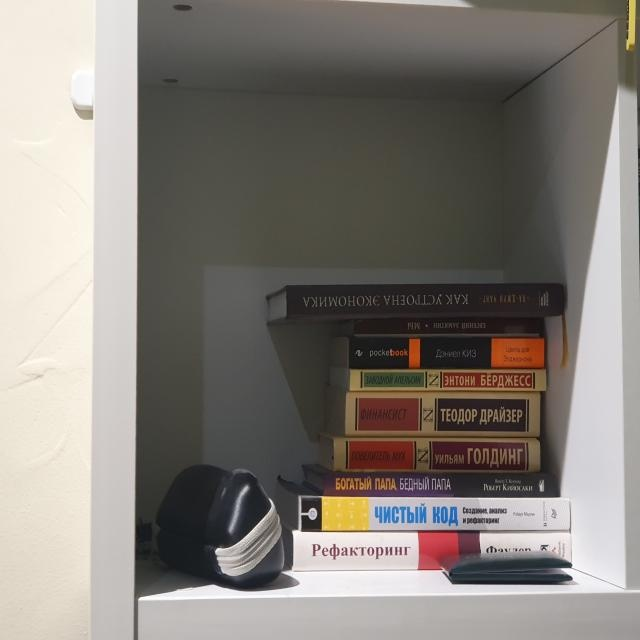

In [33]:
#display inference on ALL test images
#this looks much better with longer training above

"""
exp3 - test, conf 0.4
exp4 - valid, conf 0.4
exp5 - valid, conf 0.2
"""

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp5/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

## mAP, Speed, Size

- **mAP among all classes:**

```
    mAP50 = 0.568
    mAP50-95 = 0.211
```

- **Speed of inference:** 8.2 ms

- **Model Size:** 14.4 MB (7015519 parameters)

In [35]:
"""
custom_YOLOv5s summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 1/1 [00:00<00:00, 12.71it/s]
                   all          5         28      0.599       0.61      0.568      0.211
                  book          5         15      0.719      0.682      0.675       0.24
                   car          5         13       0.48      0.538      0.461      0.182

...

Speed: 0.3ms pre-process, 8.2ms inference, 0.8ms NMS per image at shape (1, 3, 416, 416)
"""